In [78]:
import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
%matplotlib inline
import re
import psycopg2
import json
import math
import datetime
from sqlalchemy import create_engine
import seaborn as sb
import os

import pprint
pp = pprint.PrettyPrinter(indent=4)

from scipy.stats import ttest_ind
from scipy.stats import mannwhitneyu
import scipy.stats

from sklearn.model_selection import GridSearchCV
from sklearn import linear_model
from sklearn import metrics
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.model_selection import GridSearchCV, cross_val_predict
from sklearn.manifold import TSNE
from sklearn.metrics import accuracy_score, plot_confusion_matrix, balanced_accuracy_score
import joblib
import requests

import plotly.express as px
from scipy.signal import argrelmax, butter, freqs, sosfilt, filtfilt, sosfiltfilt
import seaborn as sb


from IPython.core.display import HTML
from urllib.parse import urlparse, parse_qs
pd.options.display.max_columns = 150
pd.options.display.max_rows = 150
HTML("<style>.container { width:100% !important; }</style>")

In [4]:
# To do: Butterworth
# 40 seconden - naar 2min?
# Andere parken
# Amplitude op relatieve waarde
# Regressie parameters: Golfhoogte, golfrichting, wind snelheid, windrichting, wind-wave misalignment, GSensCAN_ForceX, GSensCAN_ForceY


## Quick recap of Fourier Transformation

X time points: 1000
Duration: 10.0 s
Sampling rate: 100.0Hz
Nyquist frequency: 50.0Hz
Signal frequency of 2Hz
X samples: 1000

1000 calculated fourier points
1000 calculated fourier frequency points


Text(0.5, 0, 'Hz')

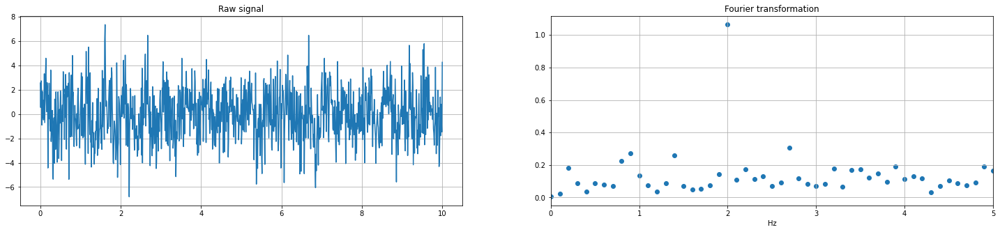

In [9]:
fig, axes = plt.subplots(1,2,figsize=(25,5))

# Generate signal
time = np.linspace(0,10,1000, dtype=float)
print('X time points: {}'.format(len(time)))
duration = max(time)
print('Duration: {} s'.format(duration))
fsampling = len(time)/duration
print('Sampling rate: {:.1f}Hz'.format(fsampling))
print('Nyquist frequency: {:.1f}Hz'.format(fsampling/2))
fsignal = 2
print('Signal frequency of {}Hz'.format(fsignal))
samples = (np.sin(2*np.pi*np.arange(fsampling*duration)*fsignal/fsampling))+np.random.randn(len(time))*2
print('X samples: {}'.format(len(samples)))

axes[0].plot(time, samples)
axes[0].set_title('Raw signal')
axes[0].grid()

# Fourier transformation
fourier = np.fft.fft(samples)
fourier_abs = np.abs(fourier)/len(samples)*2
print('\n{} calculated fourier points'.format(len(fourier)))
freq = np.fft.fftfreq(len(time), d=1/fsampling)
print('{} calculated fourier frequency points'.format(len(freq)))

axes[1].scatter(freq, fourier_abs)
axes[1].set_xlim(0,fsampling/2)
axes[1].set_title('Fourier transformation')
axes[1].grid()
axes[1].set_xlim(0,5)
axes[1].set_xlabel('Hz')

## Read in raw data

The data used for this analysis are 1second power measurements on park level of the offshore wind farms:
- Mermaid (28WTG, 8.4MW per WTG, 235MW capacity in total)
- Seastar (30WTG, 8.4MW per WTG, 252MW capacity in total)
- Rentel (42 WTG, 7.35MW per WTG, 309MW capacity in total)

The time period is from 2 November until 28 November.

In [10]:
raw_data_mermaid  = []
raw_data_seastar = []
raw_data_rentel = []

root_dir = '/Volumes/W/2021-12-06 Second data export/'

for filename in os.listdir(root_dir):
    if not re.search('.csv', filename): continue
    if not re.search('1 Second', filename): continue        
    if filename[:2]=='._': continue
    print(filename)
    
    if(re.search('Mermaid', filename)):
        if(len(raw_data_mermaid)==0): raw_data_mermaid = pd.read_csv(root_dir+filename, sep=';')
        else: raw_data_mermaid = pd.concat([raw_data_mermaid, pd.read_csv(root_dir+filename, sep=';')], axis=0)
            
    if(re.search('Rentel', filename)):
        if(len(raw_data_rentel)==0): raw_data_rentel = pd.read_csv(root_dir+filename, sep=';')
        else: raw_data_rentel = pd.concat([raw_data_rentel, pd.read_csv(root_dir+filename, sep=';')], axis=0)
            
    if(re.search('Seastar', filename)):
        if(len(raw_data_seastar)==0): raw_data_seastar = pd.read_csv(root_dir+filename, sep=';')
        else: raw_data_seastar = pd.concat([raw_data_seastar, pd.read_csv(root_dir+filename, sep=';')], axis=0)       
            
print('Read in {} lines of Mermaid data'.format(len(raw_data_mermaid)))
print('Read in {} lines of Seastar data'.format(len(raw_data_seastar)))
print('Read in {} lines of Rentel data'.format(len(raw_data_rentel)))

Rentel 2021120_COMP_Rentel - 20.11.2021 - 27.11.2021_e743_20_11_21_01_00_00_High resolution parameters 1 Second.csv
Seastar 20111101_COMP_Seastar - 01.11.2021 - 09.11.2021_5ca9_01_11_21_01_00_00_High resolution parameters 1 Second(1).csv
Mermaid - 20211120_COMP_Mermaid - 20.11.2021 - 28.11.2021_2def_20_11_21_01_00_00_High resolution parameters 1 Second.csv
Rentel 20211110_COMP_Rentel - 10.11.2021 - 19.11.2021_14ce_10_11_21_01_00_00_High resolution parameters 1 Second.csv
Mermaid 20211102_COMP_Mermaid - 02.11.2021 - 9.11.2021_d131_01_11_21_01_00_00_High resolution parameters 1 Second.csv
Seastar 20111120_COMP_Seastar - 20.11.2021 - 28.11.2021_e1bc_20_11_21_01_00_00_High resolution parameters 1 Second(1).csv
Mermaid 20211110_COMP_Mermaid - 10.11.2021 - 20.11.2021_0661_10_11_21_01_00_00_High resolution parameters 1 Second.csv
Seastar 20111110_COMP_Seastar - 10.11.2021 - 19.11.2021_c5fb_10_11_21_13_00_00_High resolution parameters 1 Second(1).csv
Rentel 20211101_COMP_Rentel - 1.11.2021 - 0

In [12]:
print('{:.1f}% of lines in Mermaid data is null'.format(raw_data_mermaid['Active Power Phase Total Average'].isnull().mean()*100))
raw_data_mermaid = raw_data_mermaid.loc[~raw_data_mermaid['Active Power Phase Total Average'].isnull(),:]
print('{:.1f}% of lines in Seastar data is null'.format(raw_data_seastar['Active Power Phase Total Average'].isnull().mean()*100))
raw_data_seastar = raw_data_seastar.loc[~raw_data_seastar['Active Power Phase Total Average'].isnull(),:]
print('{:.1f}% of lines in Rentel data is null'.format(raw_data_rentel['Active Power Phase Total Average'].isnull().mean()*100))
raw_data_rentel = raw_data_rentel.loc[~raw_data_rentel['Active Power Phase Total Average'].isnull(),:]

0.0% of lines in Mermaid data is null
0.0% of lines in Seastar data is null
0.0% of lines in Rentel data is null


In [13]:
# Clean up. Converting date-time to timeseries takes a bit of time
raw_data_seastar['Date and Time'] = pd.to_datetime(raw_data_seastar['Date and Time'], format='%m/%d/%Y %I:%M:%S.%f%p')
raw_data_mermaid['Date and Time'] = pd.to_datetime(raw_data_mermaid['Date and Time'], format='%m/%d/%Y %I:%M:%S.%f%p')
raw_data_rentel['Date and Time'] = pd.to_datetime(raw_data_rentel['Date and Time'], format='%m/%d/%Y %I:%M:%S.%f%p')

# Convert power to MW
raw_data_seastar['Active Power Phase Total Average'] = -raw_data_seastar['Active Power Phase Total Average']/1000000
raw_data_mermaid['Active Power Phase Total Average'] = -raw_data_mermaid['Active Power Phase Total Average']/1000000
raw_data_rentel['Active Power Phase Total Average'] = -raw_data_rentel['Active Power Phase Total Average']/1000000

# Rename columns
raw_data_seastar = raw_data_seastar.rename(columns={'Date and Time':'datetime', 
                                           'Active Power Phase Total Average':'seastar_active_power'})
raw_data_seastar = raw_data_seastar.set_index('datetime')

raw_data_mermaid = raw_data_mermaid.rename(columns={'Date and Time':'datetime', 
                                           'Active Power Phase Total Average':'mermaid_active_power'})
raw_data_mermaid = raw_data_mermaid.set_index('datetime')


raw_data_rentel = raw_data_rentel.rename(columns={'Date and Time':'datetime', 
                                           'Active Power Phase Total Average':'rentel_active_power'})
raw_data_rentel = raw_data_rentel.set_index('datetime')

# Sort index
raw_data_mermaid = raw_data_mermaid.sort_index()
raw_data_seastar = raw_data_seastar.sort_index()
raw_data_rentel = raw_data_rentel.sort_index()

print('Data from Mermaid ranging from {} to {}'.format(raw_data_mermaid.index.min(), raw_data_mermaid.index.max()))
print('Data from Seastar ranging from {} to {}'.format(raw_data_seastar.index.min(), raw_data_seastar.index.max()))
print('Data from Rentel ranging from {} to {}'.format(raw_data_rentel.index.min(), raw_data_rentel.index.max()))

In [20]:
# Join the data of the 3 offshore windfarms. Disregard timestamps of which the power output of each windfarm seperaty is not known.
data_3_parks = pd.merge(raw_data_mermaid, raw_data_seastar, how='inner', left_index=True, right_index=True)
data_3_parks = pd.merge(data_3_parks, raw_data_rentel, how='inner', left_index=True, right_index=True)

# Take the sum of the 3 parks
data_3_parks['total_active_power'] = data_3_parks['mermaid_active_power'] + data_3_parks['seastar_active_power'] + data_3_parks['rentel_active_power']

data_3_parks.sample(5)


,mermaid_active_power,seastar_active_power,rentel_active_power
datetime,,,
2021-11-23 07:13:22,60.001780,47.989970,35.271730
2021-11-28 02:47:29,222.677800,238.551200,295.145200
2021-11-08 18:12:36,0.127204,2.834981,0.765502
2021-11-25 03:12:58,55.626260,44.259790,56.583370
2021-11-07 02:47:11,228.979800,232.613100,289.750700


In [139]:
# Plotly interactive graph
downsampled_data = data_3_parks.copy().resample('60S').mean()
downsampled_data = downsampled_data.reset_index()
fig = px.line(downsampled_data, x='datetime', y=["mermaid_active_power", "seastar_active_power", "rentel_active_power"])
fig.show()

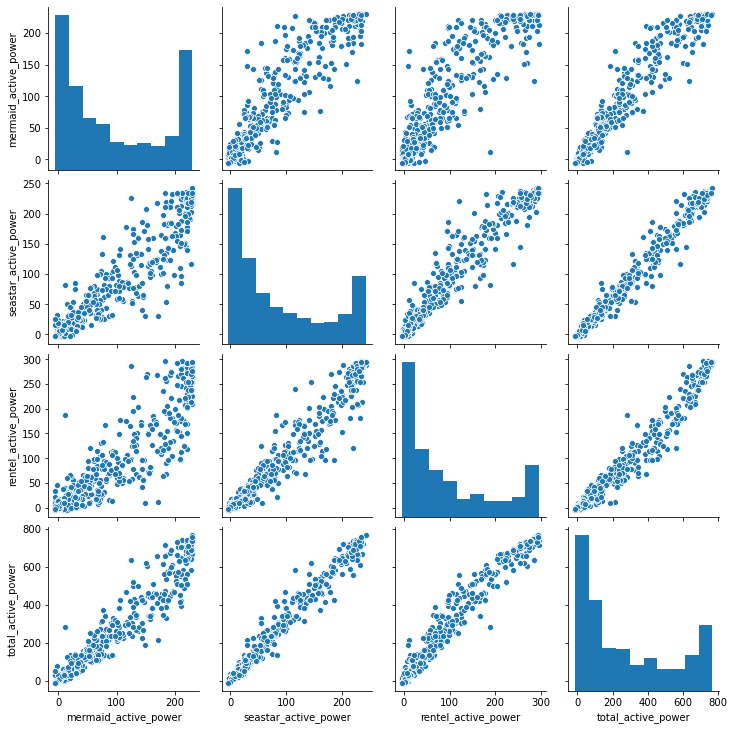

In [140]:
# Are the power outputs of the different windfarms correlated with each other?
sb.pairplot(downsampled_data.sample(500))

## Fourier transformation complete time period

A first very rough analysis to investigate the nature of the problem. A simple fourier transformation of the complete time period is made, and the maximum frequency between 0,2Hz and 0,3Hz is calculated for each windfarm individually and the total of the three windfarms combined.

In [141]:
data_3_parks.head()

,mermaid_active_power,seastar_active_power,rentel_active_power,total_active_power
datetime,,,,
2021-11-02 14:00:00,13.38953,13.88150,20.03320,47.30423
2021-11-02 14:00:01,13.45399,14.09939,19.93910,47.49248
2021-11-02 14:00:01,13.45399,14.09939,20.12528,47.67866
2021-11-02 14:00:02,13.30142,14.13340,20.20849,47.64331
2021-11-02 14:00:03,13.08963,13.99785,20.22351,47.31099


Sampling frequency = 1.02Hz


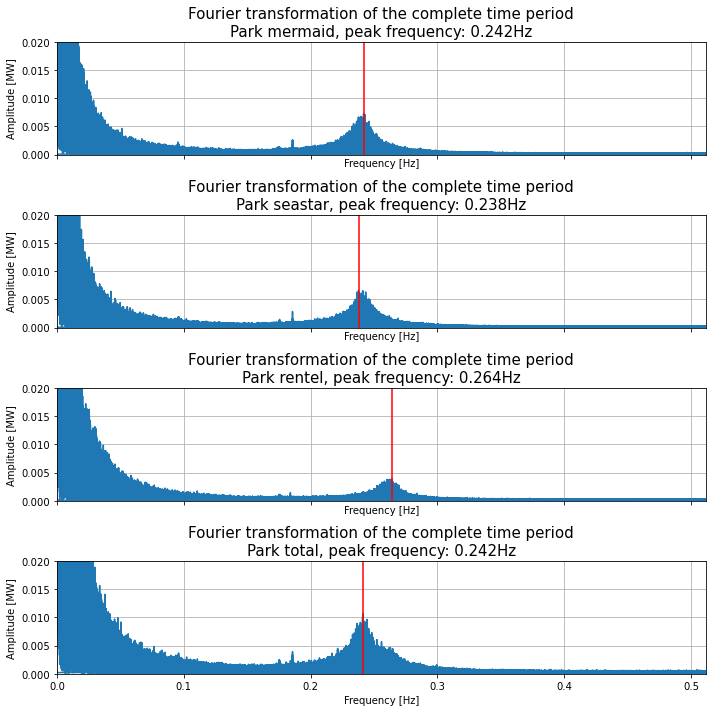

In [213]:
# Calculate sampling frequency
fsampling = (data_3_parks.index.max() - data_3_parks.index.min())/(len(data_3_parks)-1)
fsampling = fsampling.total_seconds()
print('Sampling frequency = {:.2f}Hz'.format(fsampling))

fig, axes = plt.subplots(4,1,figsize=(10,10), sharex=True)

for i, park in enumerate(['mermaid', 'seastar', 'rentel', 'total']):

    # Fourier transformation
    fourier = np.fft.fft(data_3_parks['{}_active_power'.format(park)])
    fourier = np.abs(fourier)/len(data_3_parks)*2
    freq = np.fft.fftfreq(len(data_3_parks), 1/fsampling)
    fourier_df = pd.DataFrame({'freq':freq,
                              'fourier': fourier})

    # Find local maxima between 0.2 and 0.3Hz
    row_mask = fourier_df['freq'].between(0.2, 0.3)
    index_maximum = np.argmax(fourier_df.loc[row_mask, 'fourier'].values)
    resonance_frequency = fourier_df.loc[row_mask,:].iloc[index_maximum,:]['freq']
    #print('Local maximum between 0.2Hz and 0.3Hz found at {:.3f}Hz'.format(resonance_frequency))

    # Plot of fourier transformation
    axes[i].plot(fourier_df['freq'], fourier_df['fourier'])
    axes[i].set_xlim(0, fsampling/2)
    axes[i].set_ylim(0, 0.02)
    axes[i].axvline(resonance_frequency, c='red')
    axes[i].set_title('Fourier transformation of the complete time period\nPark {}, peak frequency: {:.3f}Hz'.format(
        park, resonance_frequency), size=15)
    axes[i].set_xlabel('Frequency [Hz]')
    axes[i].set_ylabel('Amplitude [MW]')
    axes[i].grid()
    
fig.tight_layout()

## Function to apply Butterworth filter to a shorter time bin

The function does the following with a time series:

- Verify that the timeseries is consequtive, or in other words, that there are no time gaps
- Apply the second order bandpass butterworth filter, with lowpass frequency 0,15Hz and highpass frequency 0,3Hz.
- Calculate and return the average power of the absolute values of the filtered signal
- Make a plot if requested


In [204]:
# Import necessary packages
from scipy.signal import argrelmax, butter, freqs, sosfilt, filtfilt, sosfiltfilt

In [259]:
# For digital filters, Wn are in the same units as fs. 
# By default, fs is 2 half-cycles/sample, so these are normalized from 0 to 1, 
# where 1 is the Nyquist frequency. (Wn is thus in half-cycles / sample.)
fs = 1
lowcut = 0.15
highcut = 0.3

nyq = 0.5*fs
low = lowcut / nyq
high = highcut / nyq

# Calculate the parameters of the filter and apply the filter
sos = butter(N=1, Wn=[low, high], btype='bandpass', analog=False, output='sos')

def applyButterWorth(signal, to_plot=False):
        
    #Empty return dict. We will fill this up with calculated parameters
    return_dict = {}
    
    # Check if there are no time gaps
    if (len(signal)-1 != (signal.index.max() - signal.index.min()).seconds):
        return { 'timeseries_test': 'Time gaps in timeseries'}
    return_dict['timeseries_test'] = 'OK'
    
    # Store mean power of the original signal
    return_dict['mean_power'] = np.mean(signal)
    
    # Store the intial time
    return_dict['intial_time'] = signal.index[0]
    
    signal_filtered = sosfiltfilt(sos, x=signal)
    mean_amplitude = np.mean(np.abs(signal_filtered))
    return_dict['mean_amplitude_filtered_signal'] = mean_amplitude
    return_dict['mean_amplitude_filtered_signal_relative'] = mean_amplitude*100 / np.mean(signal)
    
    if(to_plot):
        
        fig, axes = plt.subplots(1,2,figsize=(20,5))
        
        axes[0].plot(signal)
        axes[0].set_title('Original signal', size=15)
        axes[0].set_xlabel('Time [s]')
        axes[0].set_ylabel('Power [MW]')
        axes[0].grid()
        
        axes[1].plot(signal_filtered)
        axes[1].set_title('Filtered signal', size=15)
        axes[1].set_xlabel('Time [s]')
        axes[1].set_ylabel('Power [MW]')   
        axes[1].axhline(mean_amplitude, c='C3')
        axes[1].axhline(-mean_amplitude, c='C3')
        axes[1].text(0, mean_amplitude+0.1, s='Mean amplitude: {:.3f}'.format(mean_amplitude), c='C3')
        axes[1].grid()
    
    return return_dict


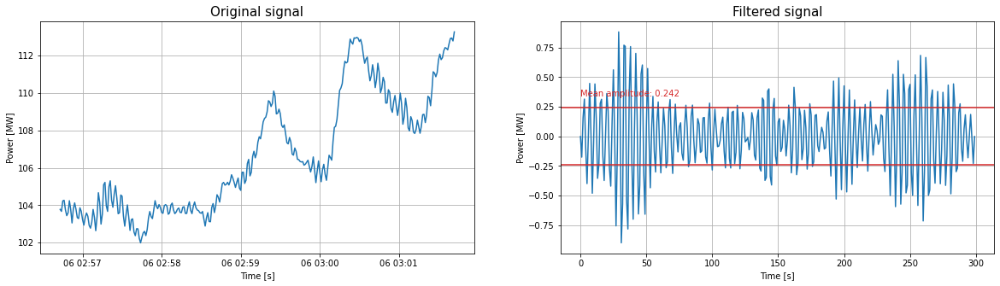

In [260]:
# Tryout this function on a random time period on mermaid
np.random.seed(0)
random_start = np.random.randint(low=0, high=len(data_3_parks))

# Apply the Butter Worth filter
no_print = applyButterWorth(data_3_parks.iloc[random_start:random_start+300,:]['mermaid_active_power'], to_plot=True)

## Apply the filter to 10.000 random short term time periods

We can now apply the applyButterWorth function to 10.000 random time periods. We will apply the filter to all 3 windfarms + the total of the tree windfarms.

You can choose the length of this time period. 

In [261]:
time_period = 300

In [262]:
counter = 0
results_mermaid = []
results_seastar = []
results_rentel = []
results_total = []

while counter < 1000:
    
    if(counter%100==0): print('Calculating parameters of random window {}'.format(counter))
    
    # Generate random start index
    random_start_index = np.random.randint(low=0, high=len(data_3_parks))
    short_time_period = data_3_parks.iloc[random_start_index:random_start_index+300,:].copy()
    
    # Calculate and save parameters of this time window
    results_mermaid.append(applyButterWorth(short_time_period['mermaid_active_power'], to_plot=False))
    results_seastar.append(applyButterWorth(short_time_period['seastar_active_power'], to_plot=False))
    results_rentel.append(applyButterWorth(short_time_period['rentel_active_power'], to_plot=False))
    results_total.append(applyButterWorth(short_time_period['total_active_power'], to_plot=False))
    
    counter += 1
    
results_mermaid_df = pd.DataFrame(results_mermaid)
results_mermaid_df = results_mermaid_df.rename(columns={
    'mean_power': 'mermaid_mean_power',
    'mean_amplitude_filtered_signal': 'mermaid_mean_amplitude_filtered_signal',
    'mean_amplitude_filtered_signal_relative': 'mermaid_mean_amplitude_filtered_signal_relative'
})

results_seastar_df = pd.DataFrame(results_seastar)
results_seastar_df = results_seastar_df.rename(columns={
    'mean_power': 'seastar_mean_power',
    'mean_amplitude_filtered_signal': 'seastar_mean_amplitude_filtered_signal',
    'mean_amplitude_filtered_signal_relative': 'seastar_mean_amplitude_filtered_signal_relative'
})

results_rentel_df = pd.DataFrame(results_rentel)
results_rentel_df = results_rentel_df.rename(columns={
    'mean_power': 'rentel_mean_power',
    'mean_amplitude_filtered_signal': 'rentel_mean_amplitude_filtered_signal',
    'mean_amplitude_filtered_signal_relative': 'rentel_mean_amplitude_filtered_signal_relative'
})

results_total_df = pd.DataFrame(results_total)
results_total_df = results_total_df.rename(columns={
    'mean_power': 'total_mean_power',
    'mean_amplitude_filtered_signal': 'total_mean_amplitude_filtered_signal',
    'mean_amplitude_filtered_signal_relative': 'total_mean_amplitude_filtered_signal_relative'
})

results = pd.concat([results_total_df, 
          results_mermaid_df.drop(columns=['timeseries_test', 'intial_time']),
          results_seastar_df.drop(columns=['timeseries_test', 'intial_time']),
          results_rentel_df.drop(columns=['timeseries_test', 'intial_time'])], axis=1)

Calculating parameters of random window 0
Calculating parameters of random window 100
Calculating parameters of random window 200
Calculating parameters of random window 300
Calculating parameters of random window 400
Calculating parameters of random window 500
Calculating parameters of random window 600
Calculating parameters of random window 700
Calculating parameters of random window 800
Calculating parameters of random window 900


## Analyse the results

- Drop time periods in which there were time gaps
- Drop time periods in which the power output was below 0MW


In [263]:
results_cleaned = results.copy()

print('Start with {} time bins'.format(len(results_cleaned)))
results_cleaned = results_cleaned.loc[(results_cleaned['timeseries_test']=='OK'),:]
results_cleaned = results_cleaned.loc[(results_cleaned['total_mean_power']>0),:]
results_cleaned = results_cleaned.loc[(results_cleaned['mermaid_mean_power']>0),:]
results_cleaned = results_cleaned.loc[(results_cleaned['seastar_mean_power']>0),:]
results_cleaned = results_cleaned.loc[(results_cleaned['rentel_mean_power']>0),:]
print('{} time bins left after removal of time gaps and negative powers'.format(len(results_cleaned)))

results_cleaned.sample()

Start with 1000 time bins
844 time bins left after removal of time gaps and negative powers


,timeseries_test,total_mean_power,intial_time,total_mean_amplitude_filtered_signal,total_mean_amplitude_filtered_signal_relative,mermaid_mean_power,mermaid_mean_amplitude_filtered_signal,mermaid_mean_amplitude_filtered_signal_relative,seastar_mean_power,seastar_mean_amplitude_filtered_signal,seastar_mean_amplitude_filtered_signal_relative,rentel_mean_power,rentel_mean_amplitude_filtered_signal,rentel_mean_amplitude_filtered_signal_relative
919,OK,762.080198,2021-11-26 12:21:59,0.551763,0.072402,229.321517,0.366515,0.159826,241.362914,0.284119,0.117714,291.395767,0.279828,0.09603


In [264]:
# Bin the results in power bins. These bins are based on the total power of the 3 parks combined    
results_cleaned['average_power_bin'], powerbins = pd.cut(results_cleaned['total_mean_power'], 
                                                         bins=[0,50,100,200,300,400,500,600,700,800], retbins=True)

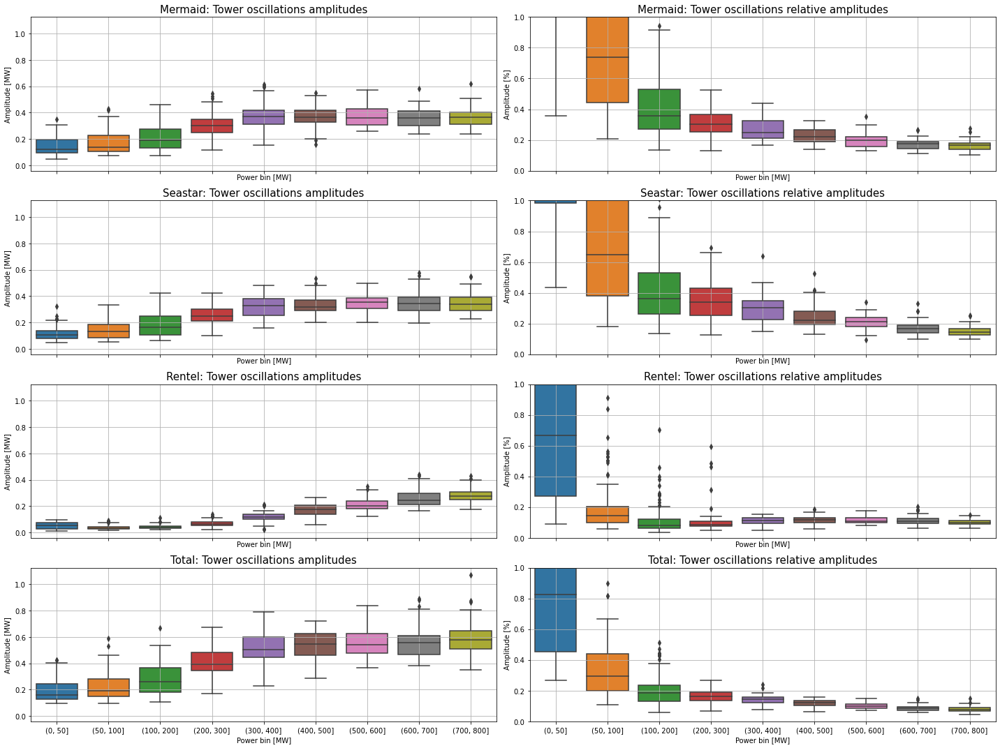

In [266]:
# Boxplot
fig, axes = plt.subplots(4,2,figsize=(20,15), sharex=True, sharey='col')

for i, park in enumerate(['mermaid', 'seastar', 'rentel', 'total']):

    sb.boxplot(x="average_power_bin", y="{}_mean_amplitude_filtered_signal".format(park), data=results_cleaned, ax=axes[i][0])
    axes[i][0].set_title('{}: Tower oscillations amplitudes'.format(str.title(park)), size=15)
    axes[i][0].set_xlabel('Power bin [MW]')
    axes[i][0].set_ylabel('Amplitude [MW]')
    axes[i][0].grid()

    sb.boxplot(x="average_power_bin", y="{}_mean_amplitude_filtered_signal_relative".format(park), 
               data=results_cleaned, ax=axes[i][1])
    axes[i][1].set_title('{}: Tower oscillations relative amplitudes'.format(str.title(park)), size=15)
    axes[i][1].set_xlabel('Power bin [MW]')
    axes[i][1].set_ylabel('Amplitude [%]')
    axes[i][1].grid()
    axes[i][1].set_ylim(0,1)

fig.tight_layout()


# Old Code

In [ ]:

# Plotly interactive graph
temp_plot = data_3_parks.iloc[random_start:random_start+300,:].copy()

# Smooth the production curve, to remove power osscilations due to wind
for i, park_name in enumerate(['mermaid', 'seastar', 'rentel', 'total']):
    lowess = sm.nonparametric.lowess
    temp_plot['{}_active_power_smooth'.format(park_name)] = lowess(temp_plot['{}_active_power'.format(park_name)], np.arange(len(temp_plot)), frac=1./20)[:,1]
    temp_plot['{}_active_power_residuals'.format(park_name)] = temp_plot['{}_active_power'.format(park_name)] - temp_plot['{}_active_power_smooth'.format(park_name)]

temp_plot = temp_plot.reset_index()

fig = px.line(temp_plot,   x='datetime', y=["rentel_active_power_residuals"])
fig.show()

In [118]:
def calculate_parameters_timebin(time_bin_data, print_output=False):
    
    fsampling = 1
    return_dict = {
        'start_time': time_bin_data.index.min(),
        'stop_time':time_bin_data.index.max(),
    }
    
    # Check if there are no gaps
    if (len(time_bin_data)-1 != (time_bin_data.index.max() - time_bin_data.index.min()).seconds):
        return {
        'timeseries_test': 'Len TS {:.1f} not equal to number of seconds {:.1f}'.format(
            len(time_bin_data),
            (time_bin_data.index.max() - time_bin_data.index.min()).seconds)
    }
    return_dict['timeseries_test'] = 'OK'
    
    # Check that there are no negative powers
    if(time_bin_data['total_active_power'].min() < 0):
                return {'total_park_power_negative_test':'Not OK'}
    return_dict['total_park_power_negative_test'] = 'OK'
    
    if(print_output): 
        fig, axes = plt.subplots(5,4,figsize=(20,15), sharex='row', sharey='row')
    
    # Calculate for each park the frequency and amplitude
    for i, park_name in enumerate(['mermaid', 'seastar', 'rentel', 'total']):
        
        if(time_bin_data['{}_active_power'.format(park_name)].min() < 0):
                    return {'{}_park_power_negative_test'.format(park_name):'Not OK'}
        return_dict['{}_park_power_negative_test'.format(park_name)] = 'OK'        
    
        # Smooth the production curve, to remove power osscilations due to wind
        #lowess = sm.nonparametric.lowess
        #time_bin_data['{}_active_power_smooth'.format(park_name)] = lowess(time_bin_data['{}_active_power'.format(park_name)], np.arange(len(time_bin_data)), frac=1./10)[:,1]
        #time_bin_data['{}_active_power_residuals'.format(park_name)] = time_bin_data['{}_active_power'.format(park_name)] - time_bin_data['{}_active_power_smooth'.format(park_name)]
        
        # Apply the bandpassfilter
        time_bin_data['{}_active_power_filtered'.format(park_name)] = bandPassFilter(time_bin_data['{}_active_power'.format(park_name)])
        return_dict['{}_filtered_signal_average_amplitude'.format(park_name)] = time_bin_data['{}_active_power_filtered'.format(park_name)].abs().mean()
        
        # Save average power of the park
        return_dict['{}_max_power'.format(park_name)] = time_bin_data['{}_active_power'.format(park_name)].max()
        return_dict['{}_average_power'.format(park_name)] = time_bin_data['{}_active_power'.format(park_name)].mean()  
        if(print_output): print('Average power {}: {:.1f}'.format(park_name, return_dict['{}_average_power'.format(park_name)] ))
        return_dict['{}_min_power'.format(park_name)] = time_bin_data['{}_active_power'.format(park_name)].min()        
    
        # Fourier transformation on smoothed signal
        #fourier = np.fft.fft(time_bin_data['{}_active_power_residuals'.format(park_name)])
        #fourier = np.abs(fourier)/len(time_bin_data)*2
        #freq = np.fft.fftfreq(len(time_bin_data), 1/fsampling)
        #fourier_df = pd.DataFrame({'freq':freq,
        #                      'fourier': fourier})
        #fourier_df = fourier_df.loc[fourier_df['freq']>=0.05,:]
        
        # Scale the fourier values
        #scaler = StandardScaler()
        #fourier_df['fourier_scaled'] = scaler.fit_transform(fourier_df[['fourier']])
        #fourier_df['outlier'] = fourier_df['fourier_scaled']>3
            
        # Fourier transformation on filtered signal
        fourier_filtered = np.fft.fft(time_bin_data['{}_active_power_filtered'.format(park_name)])
        fourier_filtered = np.abs(fourier_filtered)/len(time_bin_data)*2
        freq_filtered = np.fft.fftfreq(len(time_bin_data), 1/fsampling)
        fourier_filtered_df = pd.DataFrame({'freq':freq_filtered,
                              'fourier': fourier_filtered})
        fourier_filtered_df = fourier_filtered_df.loc[fourier_filtered_df['freq']>=0.05,:]

        # Find local maxima between 0.15 and 0.35Hz
        #row_mask = fourier_df['freq'].between(0.15, 0.35)
        index_maximum = np.argmax(fourier_filtered_df['fourier'].values)
        resonance_frequency = fourier_filtered_df.iloc[index_maximum,:]['freq']
        amplitude = fourier_filtered_df.iloc[index_maximum,:]['fourier']
        if(print_output): print('Local maximum between 0.15Hz and 0.35Hz found at {:.3f}Hz of park {}'.format(resonance_frequency, park_name))   
            
        # Save frequency and amplitude
        return_dict['{}_amplitude'.format(park_name)] = amplitude
        return_dict['{}_amplitude_rel'.format(park_name)] = amplitude*100/time_bin_data['{}_active_power'.format(park_name)].mean()        
        return_dict['{}_resonance_frequency'.format(park_name)] = resonance_frequency
                            
        # Plot
        if(print_output):
            
            axes[0][i].plot(time_bin_data['{}_active_power'.format(park_name)])
            axes[0][i].plot(time_bin_data['{}_active_power_smooth'.format(park_name)])
            axes[0][i].set_ylabel('[MW]')
            axes[0][i].set_xlabel('[Seconds]')
            axes[0][i].set_title('Power output {}'.format(park_name))            
            
            axes[1][i].plot(time_bin_data['{}_active_power_residuals'.format(park_name)])
            axes[1][i].set_title('Power output after removing trend {}'.format(park_name))       
            axes[1][i].set_ylabel('[MW]')
            axes[1][i].set_xlabel('[Seconds]')

            axes[2][i].scatter(fourier_df['freq'], fourier_df['fourier'])
            axes[2][i].scatter(fourier_df.loc[fourier_df['outlier'], 'freq'], fourier_df.loc[fourier_df['outlier'],'fourier'], c='C3')
            #axes[1][i].plot(fourier_df['freq'], fourier_df['prediction'], c='C3')
            axes[2][i].set_title(park_name)
            axes[2][i].set_xlabel('[Hz]')
            axes[2][i].set_ylabel('Amplitude [MW]')             
            
            axes[3][i].plot(time_bin_data['{}_active_power_filtered'.format(park_name)])
            axes[3][i].set_title('Power output after apply Butterworth filter'.format(park_name))       
            axes[3][i].set_ylabel('[MW]')
            axes[3][i].set_xlabel('[Seconds]')            
            
            axes[4][i].scatter(fourier_filtered_df['freq'], fourier_filtered_df['fourier'])
            #axes[1][i].plot(fourier_df['freq'], fourier_df['prediction'], c='C3')
            axes[4][i].set_title(park_name)
            axes[4][i].set_xlabel('[Hz]')
            axes[4][i].set_ylabel('Amplitude [MW]')               

            
            fig.tight_layout()
            
            #axes[3][i].hist(fourier_df['residuals_scaled'])
            #axes[i].set_ylim(0, amplitude*2)    
            #axes[i].set_xlim(0, 0.5)
            
    return return_dict

In [119]:
results = calculate_parameters_timebin(data_3_parks.iloc[random_start:(random_start+300)].copy(), print_output=False)

results

{'start_time': Timestamp('2021-11-13 16:47:33'),
 'stop_time': Timestamp('2021-11-13 16:52:32'),
 'timeseries_test': 'OK',
 'total_park_power_negative_test': 'OK',
 'mermaid_park_power_negative_test': 'OK',
 'mermaid_filtered_signal_average_amplitude': 0.24254927841919197,
 'mermaid_max_power': 118.736,
 'mermaid_average_power': 111.98593266666673,
 'mermaid_min_power': 103.6371,
 'mermaid_amplitude': 0.1667630224324502,
 'mermaid_amplitude_rel': 0.14891425955153756,
 'mermaid_resonance_frequency': 0.23333333333333334,
 'seastar_park_power_negative_test': 'OK',
 'seastar_filtered_signal_average_amplitude': 0.18598199170164342,
 'seastar_max_power': 62.81275,
 'seastar_average_power': 59.73935816666667,
 'seastar_min_power': 54.37234,
 'seastar_amplitude': 0.14249051333369636,
 'seastar_amplitude_rel': 0.23852032848455196,
 'seastar_resonance_frequency': 0.23333333333333334,
 'rentel_park_power_negative_test': 'OK',
 'rentel_filtered_signal_average_amplitude': 0.043373725120614395,
 're

## Fourier parameters for the complete period

In [120]:
#calculate_parameters_timebin(cleaned_data)

## Calculate the frequency parameters of a random 1000 40seconds bins

In [121]:
counter = 0
results = []
time_period = 300

while counter < 1000:
    
    if(counter%10==0): print('Calculating parameters of random window {}'.format(counter))
    
    # Generate random start index
    random_start_index = np.random.randint(low=0, high=len(data_3_parks))
    
    # Calculate and save parameters of this time window
    temp_results = calculate_parameters_timebin(data_3_parks.iloc[random_start_index:random_start_index+time_period,:].copy())
    results.append(temp_results)
    
    counter += 1
    
results = pd.DataFrame(results)



Calculating parameters of random window 0
Calculating parameters of random window 10
Calculating parameters of random window 20
Calculating parameters of random window 30
Calculating parameters of random window 40
Calculating parameters of random window 50
Calculating parameters of random window 60
Calculating parameters of random window 70
Calculating parameters of random window 80
Calculating parameters of random window 90
Calculating parameters of random window 100
Calculating parameters of random window 110
Calculating parameters of random window 120
Calculating parameters of random window 130
Calculating parameters of random window 140
Calculating parameters of random window 150
Calculating parameters of random window 160
Calculating parameters of random window 170
Calculating parameters of random window 180
Calculating parameters of random window 190
Calculating parameters of random window 200
Calculating parameters of random window 210
Calculating parameters of random window 220

In [122]:
print(results['timeseries_test'].value_counts())
#print(results['Negative_power_test'].value_counts())
results = results.loc[results['timeseries_test']=='OK',:]
#results = results.loc[results['negative_power_test']=='OK',:]

OK                                                   858
Len TS 300.0 not equal to number of seconds 298.0      5
Len TS 300.0 not equal to number of seconds 296.0      3
Name: timeseries_test, dtype: int64


In [123]:
results.head()

,start_time,stop_time,timeseries_test,total_park_power_negative_test,mermaid_park_power_negative_test,mermaid_filtered_signal_average_amplitude,mermaid_max_power,mermaid_average_power,mermaid_min_power,mermaid_amplitude,mermaid_amplitude_rel,mermaid_resonance_frequency,seastar_park_power_negative_test,seastar_filtered_signal_average_amplitude,seastar_max_power,seastar_average_power,seastar_min_power,seastar_amplitude,seastar_amplitude_rel,seastar_resonance_frequency,rentel_park_power_negative_test,rentel_filtered_signal_average_amplitude,rentel_max_power,rentel_average_power,rentel_min_power,rentel_amplitude,rentel_amplitude_rel,rentel_resonance_frequency,total_filtered_signal_average_amplitude,total_max_power,total_average_power,total_min_power,total_amplitude,total_amplitude_rel,total_resonance_frequency
0,2021-11-23 12:21:10,2021-11-23 12:26:09,OK,OK,OK,0.248804,28.838310,26.911952,24.667610,0.208970,0.776495,0.236667,OK,0.209502,27.05401,23.760286,21.18962,0.189642,0.798147,0.233333,OK,0.025446,25.438870,23.747441,22.137500,0.011101,0.046745,0.180000,0.306592,79.216750,74.419680,70.034230,0.206572,0.277577,0.233333
1,2021-11-06 07:29:14,2021-11-06 07:34:13,OK,OK,OK,0.385960,198.168700,190.850436,184.666100,0.312437,0.163708,0.233333,OK,0.262667,232.28680,227.184274,220.39280,0.196709,0.086586,0.240000,OK,0.218588,269.890600,264.791845,260.153400,0.175334,0.066216,0.250000,0.487668,692.750800,682.826555,670.253400,0.372427,0.054542,0.233333
2,2021-11-04 17:49:15,2021-11-04 17:54:14,OK,OK,OK,0.285256,221.613800,219.841059,218.348200,0.179621,0.081705,0.220000,OK,0.333145,221.96730,216.604455,208.84140,0.377428,0.174248,0.236667,OK,0.218239,226.153000,203.112015,187.161300,0.174873,0.086097,0.256667,0.441640,665.051100,639.557529,621.603000,0.345952,0.054092,0.236667
3,2021-11-10 23:55:07,2021-11-11 00:00:06,OK,OK,OK,0.055926,3.755295,2.072404,1.007462,0.035316,1.704092,0.230000,OK,0.078943,14.17403,12.814087,11.40289,0.076213,0.594760,0.236667,OK,0.066729,9.629824,8.682863,7.745285,0.035976,0.414332,0.256667,0.117933,26.276589,23.569354,20.995204,0.086692,0.367817,0.236667
4,2021-11-08 03:58:05,2021-11-08 04:03:04,OK,OK,OK,0.388793,55.525460,50.703790,45.745200,0.347646,0.685642,0.240000,OK,0.379272,24.05569,21.431527,19.34124,0.253738,1.183949,0.236667,OK,0.054654,20.892550,19.009387,15.771830,0.032463,0.170774,0.246667,0.473719,96.336490,91.144704,83.566200,0.448196,0.491741,0.233333


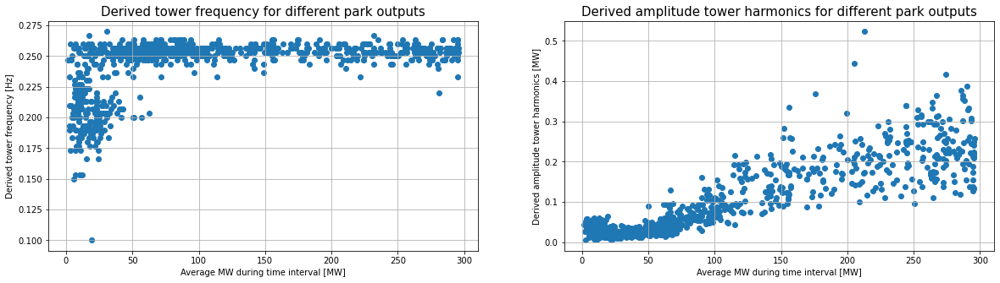

In [124]:
fig, axes = plt.subplots(1,2,figsize=(20,5))

axes[0].scatter(results['rentel_average_power'], results['rentel_resonance_frequency'])
#row_mask = results['rentel_amplitude_standardized']>3
#axes[0].scatter(results.loc[row_mask,'rentel_average_power'], results.loc[row_mask,'rentel_resonance_frequency'], c='C3')
axes[0].set_xlabel('Average MW during time interval [MW]')
axes[0].set_ylabel('Derived tower frequency [Hz]')
axes[0].set_title('Derived tower frequency for different park outputs', size=15)
axes[0].grid()

axes[1].scatter(results['rentel_average_power'], results['rentel_amplitude'])
axes[1].set_xlabel('Average MW during time interval [MW]')
axes[1].set_ylabel('Derived amplitude tower harmonics [MW]')
axes[1].set_title('Derived amplitude tower harmonics for different park outputs', size=15)
axes[1].grid()


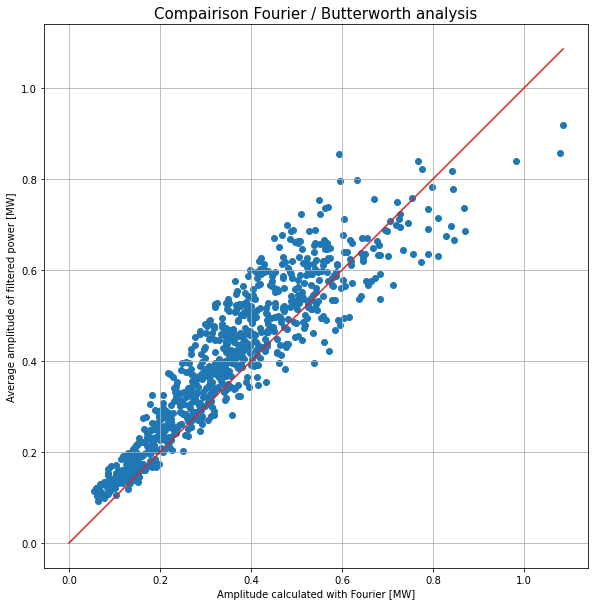

In [131]:
fig, ax = plt.subplots(1,1,figsize=(10,10))

ax.scatter(results['total_amplitude'], results['total_filtered_signal_average_amplitude'])
ax.plot([0, max(results['total_amplitude'])], [0, max(results['total_amplitude'])], c='C3')
ax.set_title('Compairison Fourier / Butterworth analysis', size=15)
ax.set_xlabel('Amplitude calculated with Fourier [MW]')
ax.set_ylabel('Average amplitude of filtered power [MW]')
ax.grid()
ax.set_aspect('equal')


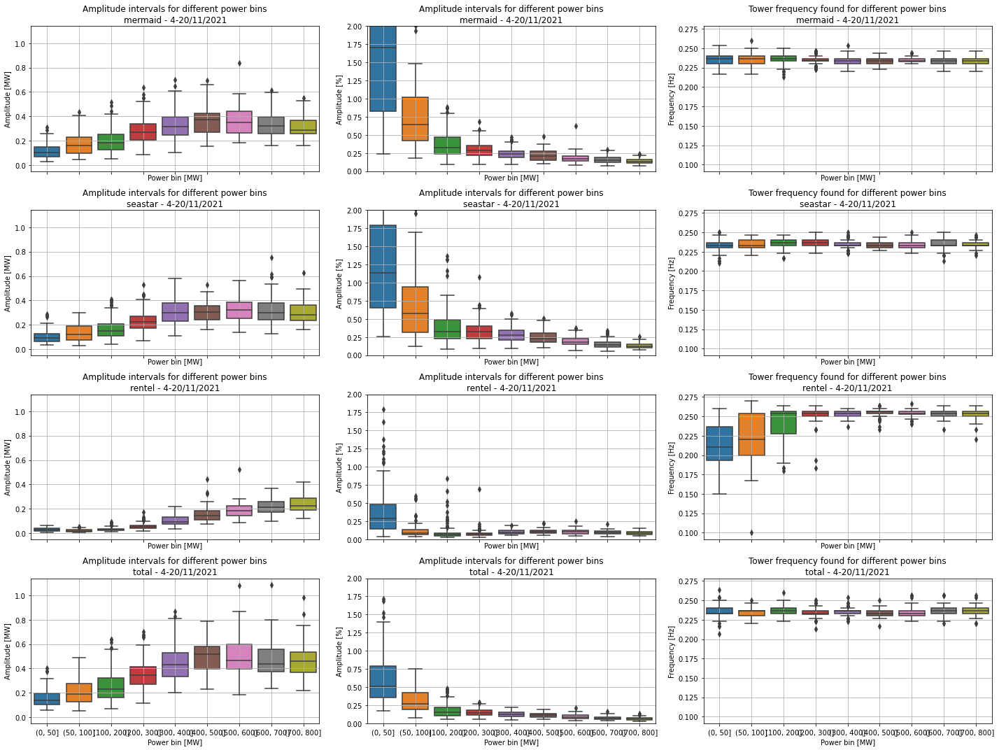

In [125]:
# Bin the results
#results = results.loc[results['total_average_power']>50,:]
results['average_power_bin'], powerbins = pd.cut(results['total_average_power'], bins=[0,50,100,200,300,400,500,600,700,800], retbins=True)
results_binned = results.groupby(['average_power_bin']).mean()

# Boxplot
fig, axes = plt.subplots(4,3,figsize=(20,15), sharex=True, sharey='col')
period = '4-20/11/2021'

for i, park in enumerate(['mermaid', 'seastar', 'rentel', 'total']):

    sb.boxplot(x="average_power_bin", y="{}_amplitude".format(park), data=results, ax=axes[i][0])
    axes[i][0].set_title('Amplitude intervals for different power bins\n{} - {}'.format(park, period))
    axes[i][0].set_xlabel('Power bin [MW]')
    axes[i][0].set_ylabel('Amplitude [MW]')
    axes[i][0].grid()
    
    sb.boxplot(x="average_power_bin", y="{}_amplitude_rel".format(park), data=results, ax=axes[i][1])
    axes[i][1].set_title('Amplitude intervals for different power bins\n{} - {}'.format(park, period))
    axes[i][1].set_xlabel('Power bin [MW]')
    axes[i][1].set_ylabel('Amplitude [%]')
    axes[i][1].grid()
    axes[i][1].set_ylim(0,2)
    
    sb.boxplot(x="average_power_bin", y="{}_resonance_frequency".format(park), data=results, ax=axes[i][2])
    axes[i][2].set_title('Tower frequency found for different power bins\n{} - {}'.format(park, period))
    axes[i][2].set_xlabel('Power bin [MW]')
    axes[i][2].set_ylabel('Frequency [Hz]')
    axes[i][2].grid()

fig.tight_layout()

In [ ]:
results = results.sort_values('average_power')

In [ ]:
results.loc[results['average_power'].between(50,100),'amplitude'].hist(bins=50)

In [ ]:
fig, axes = plt.subplots(1,len(powerbins)-1, sharey=True, sharex=True, figsize=(20,5))

for i, bin in enumerate(powerbins):

    if(i==len(powerbins)-1):continue
    
    subset = results.loc[(results['average_power'].between(powerbins[i], powerbins[i+1])),:]
    subset = subset.sort_values('amplitude')
    
    axes[i].plot(subset['amplitude'], np.linspace(0,100,len(subset)),)
    axes[i].scatter(subset['amplitude'].median(), 50, c='C3')
    axes[i].text(x=subset['amplitude'].median(), y=50, s='Median:{:.2f}MW'.format(subset['amplitude'].median()), c='C3')
    axes[i].grid()
    
    axes[i].set_xlabel('[MW]')
    axes[i].set_ylabel('Percent of time occurence')
    axes[i].set_title('Power bin {}MW - {}MW'.format(powerbins[i], powerbins[i+1]))
    
fig.suptitle('Amplitude of power at 0.23Hz due to tower damping\n {} - {}'.format(park, period), size=15)
fig.tight_layout()    
fig.subplots_adjust(top=0.8)


In [ ]:
subset

In [ ]:
for i, interval in enumerate(np.unique(results['average_power_bin'])):
    print(interval)

